# Project (code)
### David Xu (246217185)

In [7]:
using Distances, LinearAlgebra, Random, Distributions, Suppressor, Parameters, Pkg, Plots, ForwardDiff, JLD;
#add package that computes KSD
# Pkg.clone("https://github.com/zuhengxu/SteinDiscrepancy.jl")
# computing KSD when they cover the modes
using SteinDiscrepancy;
using SteinDiscrepancy: ksd;
using Base.Threads: @threads;

To save space, in this notebook we will suppress most animations and plots; only a few plots will be displayed. After running code chunks, figures will be automatically saved to `figure/`, results will be saved to `result/`, and dataset will be saved to `data/`, which will be all automatically created. 

### Utility functions

In [2]:
# Self defined util function (processing results/plotting/numerical stable function)

# stable logsumexp function 
function logsumexp(w) 
# cannot specify the type of w as array
# otherwise cannot ForwardDiff
    max = maximum(w)
    we = expm1.(w .- max) .+ 1.
    return max  + log1p(sum(we) - 1.)
end

# stable softmax function
function softmax(W)
    Ws = W .- maximum(W)
    return (expm1.(Ws) .+1.) / (expm1(logsumexp(Ws)) + 1.)
end

# gradient of logπ applied to all datapoints
# used in SVGD updates
function ∇logπ(Z::Array{Float64, 2}, lpdf::Function)
    ∇lpdf = x-> ForwardDiff.gradient(lpdf, x)
    # threads: macros to boost performance of for loop
    # inbounds: close the bound check for array
    G = similar(Z)
    @threads for i in 1:size(Z,2)
    @inbounds G[:,i] .= ∇lpdf(Z[:,i])
    end
    return G
end

#########
#plotting 
#########
#generate gif 2d
function gif2d(x, y, f::Function,T::Array{Float64,3}; folder::String = "figure/", name::String = "T.gif", title::String = "")
    # create the figure folder
    if ! isdir(folder)
        mkdir(folder)
    end 

    # gif 
    anim = @suppress_err @animate for i=1:size(T, 3)
        print(i,"/",size(T, 3), "\r")
        flush(stdout)
        contourf(x, y, f,  seriescolor = cgrad(:viridis, scale = :exp), colorbar=:none,xtickfontsize=18,ytickfontsize=18, title = title)
        scatter!(T[1,:, i], T[2,:, i], alpha=0.7,label="", ylim=(y[1], y[end]), xlim=(x[1],x[end]))
    end
    gif(anim, joinpath(folder,name), fps = 15)
end


# generate contour plot
function contour_save(x, y, f::Function,T::Array{Float64,2}; folder::String = "figure/", name::String = "trace.png", title::String = "")
    # create the figure folder 
    if ! isdir(folder)
        mkdir(folder)
    end
    #contour and scatter 
    p = contourf(x, y, f,  seriescolor = cgrad(:viridis, scale = :exp), colorbar=:none,xtickfontsize=18,ytickfontsize=18, title = title)
    scatter!(T[1,:], T[2,:], alpha=0.7, label= "", ylim=(y[1], y[end]), xlim=(x[1],x[end]))
    savefig(p, joinpath(folder, name))
end

# generate gif 1d
function gif1d(x, f::Function,T::Array{Float64,2}; folder::String = "figure/", name::String = "T.gif", title::String = "")
    # create the figure folder
    if ! isdir(folder)
        mkdir(folder)
    end 

    # gif 
    anim = @suppress_err @animate for i=1:size(T, 2)
        print(i,"/",size(T, 3), "\r")
        flush(stdout)
        histogram(T[:, i], alpha=0.5,label="", normed = true, bins = 50, xlim=(x[1],x[end]))
        plot!(x, f, linewidth = 2., xtickfontsize=18,ytickfontsize=18, title = title,  label = "")
    end
    gif(anim, joinpath(folder,name), fps = 15)
end

# generate histogram
function hist_save(x, f::Function,T::Array{Float64,1}; folder::String = "figure/", name::String = "hist.png", title::String = "")
    # create the figure folder
    if ! isdir(folder)
        mkdir(folder)
    end 
    #hist 
    p = histogram(T, alpha=0.5, normed = true, label="", bins = 50,xlim=(x[1],x[end]))
    plot!(x, f, linewidth = 2., xtickfontsize=18,ytickfontsize=18, title = title, label = "")
    savefig(p, joinpath(folder, name))
end

# making line plot for quantitative comparison
function line_plot(X, T;folder::String = "figure/", name::String = "plot.png", label = "", kwargs...)
    # create the figure folder
    if ! isdir(folder)
        mkdir(folder)
    end 
    #line plot
    p = plot(X, T, lw = 3, xtickfontsize=18,ytickfontsize=18, xguidefontsize=18, yguidefontsize=18, label = label; kwargs...)
    savefig(p, joinpath(folder, name))
end

############
# result processing
############
# compute the ksd using gaussian kernel
function ksd_gaussian(T, grd::Function)
    result = ksd(points = permutedims(T, (2,1)), gradlogdensity= grd, kernel=SteinGaussianKernel())
    return sqrt(result.discrepancy2)
end

# ksd along the iterations
function ksd_trace(T::Array{Float64, 3}, grd::Function)
    f  = M ->  ksd_gaussian(M, grd)
    ksdseq = map(f, eachslice(T, dims = 3))
    return ksdseq
end

# elbo estimation to show the change of kl
function elbo(T, lpdf)
    el = mean(map(lpdf, eachslice(T, dims = 2)))
    return el
end

# elbo along the iterations
function elbo_trace(T::Array{Float64, 3}, lpdf)
    f = M-> elbo(M, lpdf)
    es = map(f, eachslice(T, dims =3))
    return es
end


# project 2d scatters to the line y=x
function proj_xy(T::Array{Float64, 2})
    a = mapslices(mean, T, dims = 1)
    return dropdims(a;dims = 1) 
end

proj_xy (generic function with 1 method)

### Implementation of SVGD and its varaints

In [3]:
#################
## RBFkernel 
#################
# RBFkernel! (bw <0: use median trick; bw >0: use given value)
function RBFkernel!( KM::Array{Float64, 2}, ∇K::Array{Float64, 2}, θ::Array{Float64, 2}, bw::Float64) 
    n = size(θ, 2)
    K_euc = pairwise(SqEuclidean(), θ)
    #if bw<0 : use median trick
    bw = bw < 0. ? median(K_euc)/log(n) : bw
    #compute kernel matrix
    KM .= expm1.((-0.5/bw) *K_euc) .+ 1.
    D = similar(θ)
    #computing the KM and ∇K with multithread
    @views @inbounds @threads for i in 1:n
        D .= θ .- θ[:, i]
        #∇K[:, j] = ∑_i ∇ K(Xi, Yj)
        ∇K[:, i] = -(1. / bw)*D * KM[:, i]
    end
    return KM , ∇K
end

#################
## anisoptropical(localized) gaussian kernel 
#################
function Gausskernel!(KM::Array{Float64, 2}, ∇K::Array{Float64, 2}, θ::Array{Float64, 2},H::Function, Σ_rule::Function)
    n = size(θ, 2)
    D = similar(θ)
    #computing the KM and ∇K with multithread
    @views @inbounds for i in 1:n
        #bw for each particle
        Q =  Σ_rule(θ[:, i], H)
        #local kernel matrix 
        KM[:, i] = expm1.(-0.5* colwise(SqMahalanobis(Q), θ[:,i], θ)) .+ 1.
        #∇K[:, j] = ∑_i ∇ K(Xi, Yj)
        D .= θ .- θ[:, i]
        ∇K[:, i] = -Q*D * KM[:, i]
    end
    return KM , ∇K
end

# Σ = inv diag hessian
function Hessian_diag(x, H::Function)
    return  Matrix(Diagonal(abs.(H(x)) .+ 1e-10))
end

Hessian_diag (generic function with 1 method)

In [4]:
############
# SVGD update rule (6 different updating rules)
############
abstract type OptAlg end

@with_kw struct GD <: OptAlg
    lrt::Function
    niters::Int64
    past0::Function = x-> zero(x)
end

@with_kw struct Momentum <: OptAlg
    lrt::Function #constant
    niters::Int64
    γ::Float64 = 0.9
    past0::Function= x-> zero(x)
end

@with_kw struct AdaGrad <: OptAlg
    lrt::Function = i-> 0.01
    niters::Int64 
    ϵ::Float64 = 1e-8
    past0::Function = x-> zero(x)
end

# RMSprop = Adagrad + Momentum
@with_kw struct RMSprop <: OptAlg
    lrt::Function = i-> 0.001#constant
    niters::Int64
    γ::Float64 = 0.9
    ϵ::Float64  = 1e-8
    past0::Function= x-> zero(x)
end

@with_kw struct WAG <: OptAlg
    lrt::Function
    niters::Int64
    α::Float64 # > 3
    past0::Function= x-> x
end    
    
@with_kw struct WNes <: OptAlg
    lrt::Function #constant
    niters::Int64
    u::Float64  # upper bounds on the Lip const of ∇log
    b::Float64  # shrinkage parameter > 0
    past0::Function= x-> x
end

# Update rule for optimization (be careful on the sign of ∇)
function STEP!(alg::GD, k::Int64, θ::Array{Float64, 2}, ∇::Array{Float64, 2}, past::Array{Float64, 2})
    θ .+= alg.lrt(k)*∇ 
end

# note that the past start from zero(x0)
function STEP!(alg::Momentum, k::Int64, θ::Array{Float64, 2},  ∇::Array{Float64,2}, past::Array{Float64,2})
    v = alg.γ * past .- alg.lrt(k) * ∇
    θ .-= v
    past .= v
end

function STEP!(alg::AdaGrad, k::Int64, θ::Array{Float64, 2}, ∇::Array{Float64, 2}, past::Array{Float64, 2})
    eps = alg.lrt(k)
    past .+= ∇.^2
    θ .+=  (eps ./ sqrt.(past .+ eps)) .* ∇
end

function STEP!(alg::RMSprop, k::Int64, θ::Array{Float64, 2}, ∇::Array{Float64, 2}, past::Array{Float64, 2})
    past .= alg.γ * past + (1.0- alg.γ) * ∇.^2
    θ .+=  (alg.lrt(k) ./ sqrt.(past .+ alg.ϵ)) .* ∇
end

#past start from x0
function STEP!(alg::WAG, k::Int64, θ::Array{Float64, 2}, ∇::Array{Float64, 2}, past::Array{Float64, 2})
    adjust = (k-1.)/k *(θ .- past) .+ (k + alg.α -2. )/k *alg.lrt(k)*∇
    past .= θ .+ alg.lrt(k)*∇ 
    θ .= past .+ adjust
end

function STEP!(alg::WNes, k::Int64, θ::Array{Float64, 2}, ∇::Array{Float64, 2}, past::Array{Float64, 2})
    eps = alg.lrt(k)
    b = alg.b
    u = alg.u
    C = 1. + b - 2. *(1. +b)*(2. + b)*u*eps/(sqrt(b^2 + 4. *(1. +b)*u*eps) - b + 2. *(1. + b)*u*eps)
    adjust = C*past
    past .= θ .+ alg.lrt(k)*∇ 
    θ .= (1. +C)*past .- adjust
end

STEP! (generic function with 6 methods)

In [5]:
###############
# Different annealing sched
###############
# cyclical annealing sched
@inline function cyclical_sched(i, npercycle::Int64, p::Float64)
    return (mod(i, npercycle)/(npercycle))^p
end
# no annealing (i -> 1.)
id_sched = i::Int64 -> 1.

#68 (generic function with 1 method)

In [6]:
###############
# Different SVGD alg
###############
# SVGD struct 
@with_kw struct SVGD
	init_ptc::Array{Float64,2} 
    lpdf::Function
    ∇lpdf::Function
    kernel::Function = RBFkernel!
    anneal::Function = id_sched
end

# SVGD_Gauss struct 
@with_kw struct SVGD_Gauss
    init_ptc::Array{Float64,2} 
    lpdf::Function
    ∇lpdf::Function
    Hessian::Function
    Σ_rule::Function = Hessian_diag # function that compute local bw for each ptc
    kernel::Function = Gausskernel! # must choose RBFkernel_curv
    anneal::Function = id_sched
end

##########################
# SVGD trace/sampler(no trace save)
##########################
function svgd_trace(self::SVGD, alg::OptAlg, ntrace::Int64, bw::Float64)
    ############
    # bw > 0: use given bw 
    # bw < 0: use meian trick-->  bw = med^2/log(nptc), med is the median of the pairwise L2distance of current ptcs.
    ############

    #initial particles
    θ =	copy(self.init_ptc) #using copy then it wont overwrite the struct
    d, n = size(θ)
    #save the ptc every trace_each iters
    trace_each = ceil(alg.niters/ntrace)
    trace = zeros(d, n, ntrace+1)
    count = 1
    trace[:,:,count] = θ
    
    past = alg.past0(θ)
    K = zeros(n,n)
    ∇K = similar(θ)
    for i in 1:alg.niters
        # compute kernel matrix and ∇K 
        self.kernel(K, ∇K, θ, bw)
        # compute functional grad
        grad = 1. /n * (self.anneal(i)*self.∇lpdf(θ)* K + ∇K)
        # perform a step
        STEP!(alg, i, θ, grad, past)
        if i % trace_each == 0
            count += 1
            trace[:,:, count] .= θ   
            print(count, "/",ntrace+1, "\r")
            flush(stdout)
        end
    end
    return trace
end

function svgd_sampler(self::SVGD, alg::OptAlg, bw::Float64)
    ############
    #bw >0 : use given bw 
    #bw <0 : use meian trick-->  bw = med^2/log(nptc), med is the median of the pairwise distance of current ptcs.
    ############
    
    #initial particles
    θ =	copy(self.init_ptc) #using copy then it wont overwrite the struct
    d, n = size(θ)

    past = alg.past0(θ)
    K = zeros(n,n)
    ∇K = similar(θ)
    for i in 1:alg.niters
        # compute kernel matrix and ∇K 
        self.kernel(K, ∇K, θ, bw)
        # compute functional grad
        grad = 1. /n * (self.anneal(i)*self.∇lpdf(θ)* K + ∇K)
        # perform a step
        STEP!(alg, i, θ, grad, past)
    
        if i % 100 == 0
            print(i, "/",alg.niters, "\r")
            flush(stdout)
        end
    end
    return θ
end

#####################
# SVGD(using general gaussian kernel) trace/sampler 
#####################
function svgd_trace(self::SVGD_Gauss, alg::OptAlg, ntrace::Int64)

    #initial particles
    θ =	copy(self.init_ptc) #using copy then it wont overwrite the struct
    d, n = size(θ)
    #save the ptc every trace_each iters
    trace_each = ceil(alg.niters/ntrace)
    trace = zeros(d, n, ntrace+1)
    count = 1
    trace[:,:,count] = θ

    past = alg.past0(θ)
    K = zeros(n,n)
    ∇K = similar(θ)

    for i in 1:alg.niters
        # compute kernel matrix and ∇K 
        self.kernel(K, ∇K, θ, self.Hessian, self.Σ_rule)
        # compute functional grad
        grad = 1. /n * (self.anneal(i)*self.∇lpdf(θ)* K + ∇K)
        # perform a step
        STEP!(alg, i, θ, grad, past)
    
        if i % trace_each == 0
            count += 1
            trace[:,:, count] .= θ   
            print(count, "/",ntrace+1, "\r")
            flush(stdout)
        end
    end
    return trace
end
function svgd_sampler(self::SVGD_Gauss, alg::OptAlg)

    #initial particles
    θ =	copy(self.init_ptc) #using copy then it wont overwrite the struct
    d, n = size(θ)

    past = alg.past0(θ)
    K = zeros(n,n)
    ∇K = similar(θ)

    for i in 1:alg.niters
        # compute kernel matrix and ∇K 
        self.kernel(K, ∇K, θ, self.Hessian, self.Σ_rule)
        # compute functional grad
        grad = 1. /n * (self.anneal(i)*self.∇lpdf(θ)* K + ∇K)
        # perform a step
        STEP!(alg, i, θ, grad, past)
    
        if i % 100 == 0
            print(i, "/",alg.niters, "\r")
            flush(stdout)
        end
    end
    return θ
end

svgd_sampler (generic function with 2 methods)

Plots to show different annealing schedule:

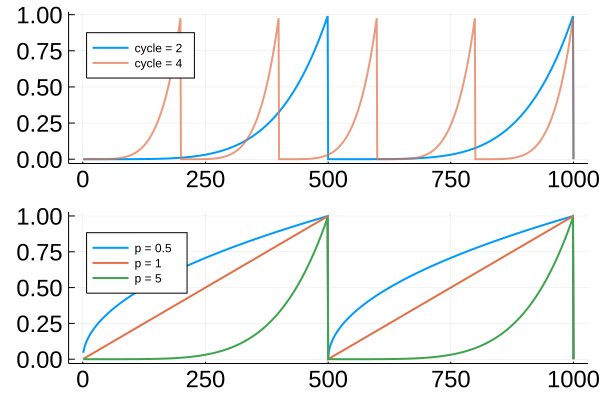

In [15]:
#plot the annealing sched
x =  1:1000
pc =plot(x, i ->  cyclical_sched(i, 500, 5.), lw = 2, xtickfontsize=16,ytickfontsize=16,
            label = "cycle = 2", legend = :topleft)
plot!(x, i ->  cyclical_sched(i, 200, 5.), alpha = 0.7,lw = 2, label = "cycle = 4")

pp = plot(x, i ->  cyclical_sched(i, 500, .5), lw = 2, xtickfontsize=16,ytickfontsize=16,
        label = "p  = 0.5", legend = :topleft)
plot!(x, i ->  cyclical_sched(i, 500, 1.),lw = 2, label = "p = 1")
plot!(x, i ->  cyclical_sched(i, 500, 5.), lw = 2, label = "p = 5")
plot(pc, pp, layout = (2,1))

## Synthetic Gaussian mixture example

In [16]:
##########
# 4*4 grid Gaussian mixture N(, 0.5^2)
##########
function logπ(Z::Vector, Mu::Array{Float64, 2})
    return logsumexp(-2. *sum((Z .- Mu).^2, dims = 1))
end
# the means for 16 Guassian components
Mu = ones(2, 16)
for j in 1:4
    @views for i in 1:4
        Mu[:, 4*(j-1) + i] = [-5. + 2*(i-1)*5. /3. , -5. + 2*(j-1)*5. /3. ]
    end
end
# lpdf for the Guassian mixture
lpdf = Z-> logπ(Z, Mu)
# grad for lpdf
∇lpdf = Z-> ∇logπ(Z, lpdf)
hessian_grid = Z -> ForwardDiff.hessian(lpdf, Z)
##########
# 2-component Gaussian mixture with different variance N(-5, 0.2^2) + N(5, 5^2)
##########
function log_mix(Z::Vector)
    return  logsumexp([logpdf(MvNormal([5.,5.], 0.5), Z), logpdf(MvNormal([-5., -5.], 3), Z) ])
end

∇log_mix = Z-> ∇logπ(Z, log_mix)
hessian_mix = Z -> ForwardDiff.hessian(log_mix, Z)

#152 (generic function with 1 method)

Compare SVGD and A-SVGD.

┌ Info: Saved animation to 
│   fn = /home/zuheng/Documents/Course/21S/STAT520B/SVGD/experiments/figure/synthetic_mixture/T0_rms.gif
└ @ Plots /home/zuheng/.julia/packages/Plots/qZHsp/src/animation.jl:98


┌ Info: Saved animation to 
│   fn = /home/zuheng/Documents/Course/21S/STAT520B/SVGD/experiments/figure/synthetic_mixture/T0_rms_anneal.gif
└ @ Plots /home/zuheng/.julia/packages/Plots/qZHsp/src/animation.jl:98


┌ Info: Saved animation to 
│   fn = /home/zuheng/Documents/Course/21S/STAT520B/SVGD/experiments/figure/synthetic_mixture/T10_rms.gif
└ @ Plots /home/zuheng/.julia/packages/Plots/qZHsp/src/animation.jl:98


┌ Info: Saved animation to 
│   fn = /home/zuheng/Documents/Course/21S/STAT520B/SVGD/experiments/figure/synthetic_mixture/T10_rms_anneal.gif
└ @ Plots /home/zuheng/.julia/packages/Plots/qZHsp/src/animation.jl:98


Plots.AnimatedGif("/home/zuheng/Documents/Course/21S/STAT520B/SVGD/experiments/figure/synthetic_mixture/T10_rms_anneal.gif")
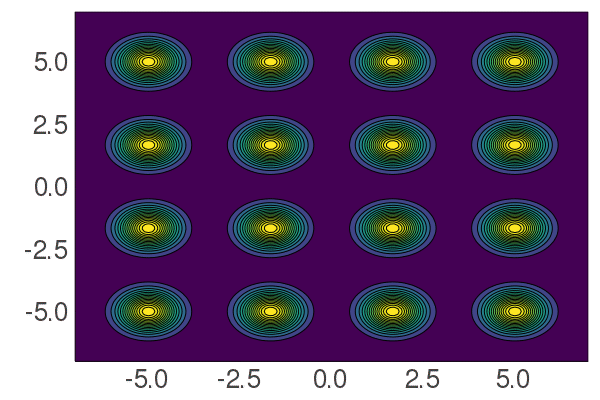

In [25]:
##########
# set up 
##########
Random.seed!(2021);
# two different init ptcs(N = 500) mu1 = (10, 10), mu2 = (0,0) 
x0  = rand(Normal(0,0.5), (2,500));
x10 = rand(Normal(10, 0.5), (2, 500));
# number of iterations
niters = 1000
#RMSprop update rule
rms = RMSprop(lrt = i-> .05, niters = niters)

#plotting params
x = -7:.1:7
y = -7:.1:7
f = (x, y) -> exp(lpdf([x, y]))
#figure path
fig_path = "figure/synthetic_mixture"

##########
##########
# 1. get SVGD/ASVGD trace (RMSprop) under 2 different init ptc 
##########
##########
# set up SVGD and A-SVGD
SV0 = SVGD(x0, lpdf, ∇lpdf, RBFkernel!, id_sched)
SV0_anneal = SVGD(x0, lpdf, ∇lpdf, RBFkernel!, i->  cyclical_sched(i, 500, 1.))
SV10 = SVGD(x10, lpdf, ∇lpdf, RBFkernel!, id_sched)
SV10_anneal = SVGD(x10, lpdf, ∇lpdf, RBFkernel!, i->  cyclical_sched(i, 500, 1.))

# get the trace
T0_rms = svgd_trace(SV0, rms, 100, .5);
T0_rms_anneal = svgd_trace(SV0_anneal, rms, 100,.5);
T10_rms = svgd_trace(SV10, rms, 100, .5);
T10_rms_anneal = svgd_trace(SV10_anneal, rms, 100,.5);

######
# plots
######
# # # contour plot save
#contour_save(x, y, f, T0_rms[:,:,end]; folder = fig_path, name = "T0_rms.png", title = "no anneling, mu0 = (0,0)");
#contour_save(x, y, f, T0_rms_anneal[:,:,end]; folder = fig_path, name = "T0_rms_anneal.png", title = "with anneling, mu0 = (0,0)");
# contour_save(x, y, f, T10_rms[:,:,end]; folder = fig_path, name = "T10_rms.png",title = "no anneling, mu0 = (10,10)");
# contour_save(x, y, f, T10_rms_anneal[:,:,end]; folder = fig_path, name = "T10_rms_anneal.png",title = "with anneling, mu0 = (10,10)");
# # gif save
gif2d(x, y, f, T0_rms; folder = fig_path, name = "T0_rms.gif");
gif2d(x, y, f, T0_rms_anneal; folder = fig_path, name = "T0_rms_anneal.gif");
gif2d(x, y, f, T10_rms; folder = fig_path, name = "T10_rms.gif");
gif2d(x, y, f, T10_rms_anneal; folder = fig_path, name = "T10_rms_anneal.gif")

Illustrate that universal bandwidth can be probalmatic.

┌ Info: Saved animation to 
│   fn = /home/zuheng/Documents/Course/21S/STAT520B/SVGD/experiments/figure/synthetic_mixture/bwsmall.gif
└ @ Plots /home/zuheng/.julia/packages/Plots/qZHsp/src/animation.jl:98


┌ Info: Saved animation to 
│   fn = /home/zuheng/Documents/Course/21S/STAT520B/SVGD/experiments/figure/synthetic_mixture/bwlarge.gif
└ @ Plots /home/zuheng/.julia/packages/Plots/qZHsp/src/animation.jl:98


Plots.AnimatedGif("/home/zuheng/Documents/Course/21S/STAT520B/SVGD/experiments/figure/synthetic_mixture/bwlarge.gif")
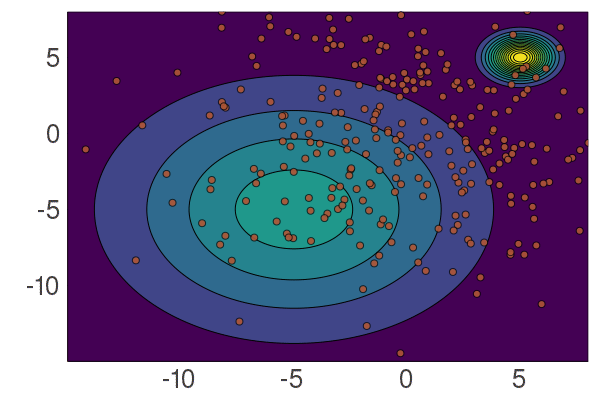

In [29]:
##########
# 2. Plots to show that better use different bw for different points 
##########
Random.seed!(2021);
fig_path = "figure/synthetic_mixture/"
# init prtc
x0  = rand(Normal(0,5), (2,300));
ASV = SVGD(x0, log_mix, ∇log_mix, RBFkernel!, i->  cyclical_sched(i, 500, 1.));
#RMSprop update rule
niters = 1000
rms = RMSprop(lrt = i-> .1, niters = niters)

#plotting params
x = -15:.1:8
y = -15:.1:8
f = (x, y) -> exp(0.35*log_mix([x, y]))

##########
# run ASVGD and obtain plots
##########
# get the trace
T_small = svgd_trace(ASV, rms, 100, .1);
T_large = svgd_trace(ASV, rms, 100, 10.);

# look at the slice y = x
π = Z -> 0.5*pdf(MvNormal([5.,5.], 0.5), Z)+0.5*pdf(MvNormal([-5., -5.], 3), Z) 
hist_save(x, z-> π([z, z]), proj_xy(T_small[:,:,end]); folder = fig_path, name = "slice_small.png", title = "bw = 0.1");
hist_save(x, z-> π([z, z]), proj_xy(T_large[:,:,end]); folder = fig_path, name = "slice_large.png", title = "bw = 10");

# save traces and contour plots
# save("example/gaussian_mix/result/bw_result_mix.jld", "bw_large", T_large, "bw_small", T_small)
# contour_save(x, y, f, T_small[:,:,end]; folder = fig_path, name = "bwsmall.png", title = "bw = 0.1")
# contour_save(x, y, f, T_large[:,:,end]; folder = fig_path, name = "bwlarge.png", title = "bw = 10")
gif2d(x, y, f, T_small; folder = fig_path, name = "bwsmall.gif");
gif2d(x, y, f, T_large; folder = fig_path, name = "bwlarge.gif")

Showing the effectiveness of using localized (anisotropical) Gaussian kernel. 

┌ Info: Saved animation to 
│   fn = /home/zuheng/Documents/Course/21S/STAT520B/SVGD/experiments/figure/synthetic_mixture/mixGauss.gif
└ @ Plots /home/zuheng/.julia/packages/Plots/qZHsp/src/animation.jl:98


┌ Info: Saved animation to 
│   fn = /home/zuheng/Documents/Course/21S/STAT520B/SVGD/experiments/figure/synthetic_mixture/grid_gs.gif
└ @ Plots /home/zuheng/.julia/packages/Plots/qZHsp/src/animation.jl:98


┌ Info: Saved animation to 
│   fn = /home/zuheng/Documents/Course/21S/STAT520B/SVGD/experiments/figure/synthetic_mixture/grid_gs10.gif
└ @ Plots /home/zuheng/.julia/packages/Plots/qZHsp/src/animation.jl:98


Plots.AnimatedGif("/home/zuheng/Documents/Course/21S/STAT520B/SVGD/experiments/figure/synthetic_mixture/grid_gs10.gif")
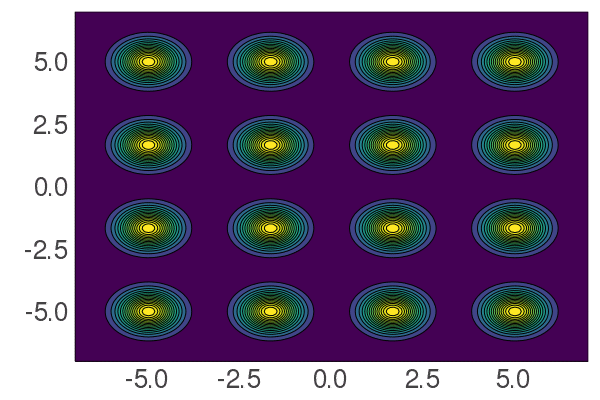

In [31]:
##########
##########
# 3. using localized Gauss kernel for gaussian mix
##########
##########
Random.seed!(2021);
x0  = rand(Normal(0,5), (2,300));
ASV_Gauss = SVGD_Gauss(init_ptc = x0, lpdf = log_mix, ∇lpdf =  ∇log_mix, 
            Hessian = hessian_mix, anneal = i->  cyclical_sched(i, 500, 1.));
niters = 1000
rms = RMSprop(lrt = i-> .1, niters = niters)
T_Gauss = svgd_trace(ASV_Gauss, rms, 100);

#plotting params
x = -15:.1:8
y = -15:.1:8
f = (x, y) -> exp(0.35*log_mix([x, y]))
gif2d(x, y, f, T_Gauss; folder = fig_path, name = "mixGauss.gif");
# plot the projected points along y = x 
π = Z -> (0.5*pdf(MvNormal([5.,5.], 0.5), Z)+0.5*pdf(MvNormal([-5., -5.], 3), Z))
hist_save(x, z-> π([z, z]), proj_xy(T_Gauss[:,:,end]); folder = fig_path, name = "slice_gauss.png", title = "Localized kernel");

##########
# 4. using localized Gauss kernel for gaussian grid
##########
Random.seed!(2021);
x0  = rand(Normal(0,0.5), (2,500));
x10 = rand(Normal(10, 0.5), (2, 500));
ASV_gs10 = SVGD_Gauss(init_ptc = x10, lpdf = lpdf, ∇lpdf =  ∇lpdf, 
            Hessian = hessian_grid, anneal = i->  cyclical_sched(i, 500, 5.));
ASV_gs = SVGD_Gauss(init_ptc = x0, lpdf = lpdf, ∇lpdf =  ∇lpdf, 
            Hessian = hessian_grid, anneal = i->  cyclical_sched(i, 500, 5.));
niters = 1000
rms = RMSprop(lrt = i-> .05, niters = niters)
#plotting params
x = -7:.1:7
y = -7:.1:7
f = (x, y) -> exp(lpdf([x, y]))

##########
# run SVGD_gauss and obtain plots
##########
T_grid_gs = svgd_trace(ASV_gs, rms, 100);
T_grid_gs10 = svgd_trace(ASV_gs10, rms, 100);
gif2d(x, y, f, T_grid_gs; folder = fig_path, name = "grid_gs.gif");
gif2d(x, y, f, T_grid_gs10; folder = fig_path, name = "grid_gs10.gif");
# contour_save(x, y, f, T_grid_gs[:,:,end]; folder = fig_path, name = "grid_gs.png")
# contour_save(x, y, f, T_grid_gs10[:,:,end]; folder = fig_path, name = "grid_gs10.png")    

## Bayesian logistic regression 

Data processing---using [student library borrow dataset](https://cran.r-project.org/web/packages/ISLR/index.html) and subsample $1000$ datapoints.

In [34]:
##########
# code that process the dataset
##########
# Import RDatasets.
using RDatasets
# Functionality for splitting and normalizing the data
using MLDataUtils: rescale!

# Import the "Default" dataset.
data = RDatasets.dataset("ISLR", "Default");
# Convert "Default" and "Student" to numeric values.
data[!,:DefaultNum] = [r.Default == "Yes" ? 1.0 : 0.0 for r in eachrow(data)]
data[!,:StudentNum] = [r.Student == "Yes" ? 1.0 : 0.0 for r in eachrow(data)]
# Delete the old columns which say "Yes" and "No".
select!(data, Not([:Default, :Student]))
# using frist 1000 datapoints
data = data[1:1000,:]

# data processing
features = [:StudentNum, :Balance, :Income]
numerics = [:Balance, :Income]
target = :DefaultNum
for feature in numerics
  μ, σ = rescale!(data[!, feature], obsdim=1)
  rescale!(data[!, feature], μ, σ, obsdim=1)
end

# Turing requires data in matrix form, not dataframe
X = Matrix(data[:, features])
Y = data[:, target]
# saving feature and label
save("data/logistic_reg/dataset.jld", "X", X, "Y", Y)

# dataset = load("data/logistic_reg/dataset.jld")

┌ Warning: JLD incorrectly extends FileIO functions (see FileIO documentation)
└ @ FileIO /home/zuheng/.julia/packages/FileIO/AmppF/src/loadsave.jl:210


Code the model.

In [35]:
#########################################################################################
# Example of Bayesian Logistic Regression (the same setting as Gershman et al. 2012):
# The observed data D = {X, y} consist of N binary class labels, 
# y_t \in {-1,+1}, and d covariates for each datapoint, X_t \in R^d.
# The hidden variables \theta = {w, \alpha} consist of d regression coefficients w_k \in R,
# and a precision parameter \alpha \in R_+. We assume the following model:
#     p(α) = Gamma(α ; a, b) , τ = log α ∈ R  
#     p(w_k | τ) = N(w_k; 0, exp(-τ))
#     p(y_t = 1| x_t, w) = 1 / (1+exp(-w^T x_t)), y ∈ {1, 0}
#########################################################################################

##########
# prior sampler (used for init particles)
##########
function prior_sampler(N, d;a = 1., b = 0.01)
    as = rand(Gamma(a, 1/b), N)
    τs = log1p.(as .- 1.)
    W = randn(N, d) .* sqrt.(1 ./as)
    return Matrix([τs W]')
end

##########
# log posterior
##########
function logπ(θ, Y, X; a =1., b = 0.01)
#θ ∈ Rd, X ∈ R_{N(d-1)}, Y ∈ RN 
    d = size(X,2)
    τ = θ[1]
    W = θ[2:end]

    logpτ = a*τ - b*(expm1(τ) +1.)
    logpW = 0.5*(d*τ - (expm1(τ) +1.)* sum(W.^2))
    llh = sum((Y .-1.) .* (X*W) .- log1p.(expm1.(-X*W)  .+1.) )

    return logpτ + logpW +llh
end

##########
# compute lpdf/∇lpdf/Hessian with dataset
##########
dat = load("data/logistic_reg/dataset.jld")
lpdf = θ-> logπ(θ, dat["Y"], dat["X"])
∇lpdf = θ -> ∇logπ(θ, lpdf)
Hessian = θ -> ForwardDiff.hessian(lpdf, θ)

┌ Warning: JLD incorrectly extends FileIO functions (see FileIO documentation)
└ @ FileIO /home/zuheng/.julia/packages/FileIO/AmppF/src/loadsave.jl:210


#358 (generic function with 1 method)

Running experiments and obtain quantitative results.

In [36]:
##########
# set up 
##########
Random.seed!(2021);
# init paritcles from prior
x0 = prior_sampler(300, 3)
# #RMSprop update rule
niters = 2000
rms = RMSprop(lrt = i-> .01, niters = niters)
#result_dir
result_dir  = "result/logistic_reg/"

##########
# build svgd(median bw) and svgd(localized kernel)
########## 
svgd = SVGD(init_ptc = x0, lpdf = lpdf, ∇lpdf = ∇lpdf, kernel = RBFkernel!)
svgd_local = SVGD_Gauss(init_ptc = x0, lpdf = lpdf, ∇lpdf= ∇lpdf, Hessian = Hessian)

##########
# Getting traces
########## 
Tsv = svgd_trace(svgd, rms, 200, -1.)
Tsv_local  =svgd_trace(svgd_local, rms, 200)
#save the traces
save(joinpath(result_dir, "Traces.jld"), "sv", Tsv, "sv_local", Tsv_local)

##########
# quantitative comparison
########## 
# ksd over all iterations 
ksv = ksd_trace(Tsv, x-> ForwardDiff.gradient(lpdf, x));
ksv_local = ksd_trace(Tsv_local, x-> ForwardDiff.gradient(lpdf, x));

# ELBO estimation Eq[log p(x, Z)] 
esv = elbo_trace(Tsv, lpdf);
esv_local = elbo_trace(Tsv_local,lpdf);

#save the ELBO and KSD
save(joinpath(result_dir, "ksd.jld"), "sv", ksv, "sv_local", ksv_local);
save(joinpath(result_dir, "elbo.jld"), "sv", esv, "sv_local", esv_local);

┌ Warning: JLD incorrectly extends FileIO functions (see FileIO documentation)
└ @ FileIO /home/zuheng/.julia/packages/FileIO/AmppF/src/loadsave.jl:210
┌ Warning: JLD incorrectly extends FileIO functions (see FileIO documentation)
└ @ FileIO /home/zuheng/.julia/packages/FileIO/AmppF/src/loadsave.jl:210
┌ Warning: JLD incorrectly extends FileIO functions (see FileIO documentation)
└ @ FileIO /home/zuheng/.julia/packages/FileIO/AmppF/src/loadsave.jl:210


Generating plots. 

┌ Warning: JLD incorrectly extends FileIO functions (see FileIO documentation)
└ @ FileIO /home/zuheng/.julia/packages/FileIO/AmppF/src/loadsave.jl:210
┌ Warning: JLD incorrectly extends FileIO functions (see FileIO documentation)
└ @ FileIO /home/zuheng/.julia/packages/FileIO/AmppF/src/loadsave.jl:210


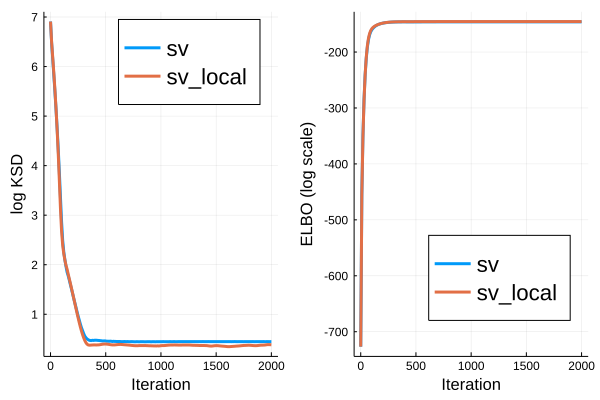

In [49]:
fig_path = "figure/logistic_reg/"
#load KSD and ELBO
K = load(joinpath(result_dir, "ksd.jld"))
E = load(joinpath(result_dir, "elbo.jld"))
ksd_seq = [ K["sv"] K["sv_local"] ]
elbo_seq = [ E["sv"] E["sv_local"] ]

# making line plot to show the elbo and ksd
X = 0:10:2000
X1 = 500:10:2000
label = ["sv" "sv_local" ]
line_plot(X, -log1p.(-elbo_seq .- 1.);  folder = fig_path, name = "logis_elbo.png",label = label, 
            xlabel = "Iteration", ylabel = "ELBO (log scale)", legendfontsize=18, legend = :bottomright)
line_plot(X,log1p.(ksd_seq .- 1.) ; folder = fig_path, name = "logis_ksd.png", label = label, 
            xlabel = "Iteration", ylabel = "log KSD", legendfontsize=18)
# show the plot
p1 = plot(X,log1p.(ksd_seq .- 1.),label = label, lw = 3, xlabel = "Iteration", ylabel = "log KSD ", legendfontsize=15)
p2 = plot(X, elbo_seq, label = label,xlabel = "Iteration", lw = 3, ylabel = "ELBO (log scale)", legendfontsize=15, legend = :bottomright)
plot(p1, p2, layout = (1,2))

## Bayesian Gaussian mixture model

Generate synthetic dataset---400 datapoints evenly generated from 4 Gaussian distributions with $N(\mu_i, 0.6^2I)$, $\mu_1, \mu_2, \mu_3, \mu_4$ are randomly generated within $[-5, 5]^2$. 

┌ Warning: JLD incorrectly extends FileIO functions (see FileIO documentation)
└ @ FileIO /home/zuheng/.julia/packages/FileIO/AmppF/src/loadsave.jl:210


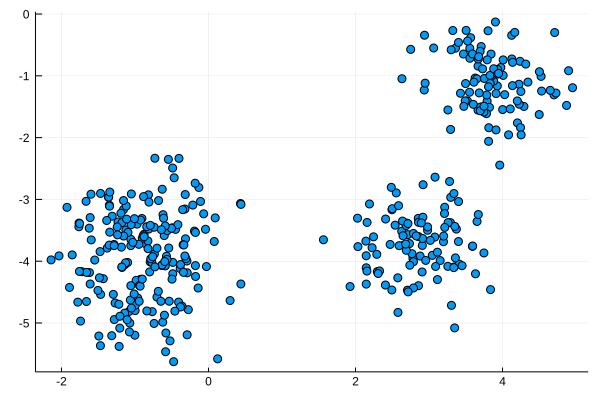

In [46]:
Random.seed!(2021);
center  = (rand(2,4) .- 0.5)*10
# generating 400 points from 4 Guassian distributions
dat  = zeros(400, 2)
dat[1:100, :] .= randn(100, 2)*0.5 .+ center[:,1]'
dat[101:200, :] .= randn(100, 2)*0.5 .+ center[:,2]'
dat[201:300, :] .= randn(100, 2)*0.5 .+ center[:,3]'
dat[301:400, :] .= randn(100, 2)*0.5 .+ center[:,4]'
# save results
save("data/GMM/dataset.jld", "X", Matrix(dat'))
# show the datapoints
scatter(dat[:, 1], dat[:,2], label = "")

Code the model. We underfit the data with a $2$-component GMM, aimming to create multimodality for posterior.

In [50]:
############
#We parameterize it such that the posterior has full support
# 1. λ1....λk ∼ LogGamma(1, 1) (then θ = softmax(λ) ∼ Dir(1))
# 2. τ_kd ∼ Normal(0,1) (σ = exp(τ) ∼ LogNormal(0,1) )
# 3. μ1...μk ∼ N(0,I)
# 4. x|λ, μ, σ ∼  ∑_k θ_k N(μ_k, diag(σ_k1, .., σ_kD) )
############

##########
# prior sampler (used for init particles)
##########
function prior_sampler(N, k, d)
    Mu = randn(k*d,N)
    Lambda = log1p.(rand(Gamma(1.,1.), k*N) .-1.)
    Tau = randn(k*d,N) 
    return vcat(Mu, reshape(Lambda,(k, N)), Tau)
end

############
#log posterior
############
function logπ(Z, X, K, D)
# Z = ( μ1...μK, λ1....λK,τ_11..τ_1D....τ_KD)
# K = number of cluster, D = dim of the data
# X ∈ R_DN
    N = size(X,2)
    Mu = @view Z[1:K*D]
    Lambda = @view Z[K*D + 1: K*D+ K]
    Tau = @view Z[K*D+ K+1 : end]
    MM = reshape(Mu, (D,K))
    X = reshape(X, (D,1,N))

    logprior = 0.5* sum(Mu.^2) + sum(Lambda .- expm1.(Lambda) .- 1.)-0.5*sum(Tau.^2)
    term1= Lambda .- logsumexp(Lambda) - 0.5*dropdims(sum(reshape(Tau, (D, K)).^2, dims = 1) , dims = 1)
    term2 = -0.5*dropdims(sum((X .- MM).^2 .*(expm1.(-reshape(Tau, (D, K,1)).^2) .+ 1.),dims = 1), dims = 1)

    llh = sum(map(logsumexp, eachslice(term1 .+ term2, dims = 2)))
    return logprior + llh
end

##########
# compute lpdf/∇lpdf/Hessian with dataset
##########
dat = load("data/GMM/dataset.jld")
lpdf = θ-> logπ(θ, dat["X"], 2,2)
∇lpdf = θ -> ∇logπ(θ, lpdf)
Hessian = θ -> ForwardDiff.hessian(lpdf, θ)

┌ Warning: JLD incorrectly extends FileIO functions (see FileIO documentation)
└ @ FileIO /home/zuheng/.julia/packages/FileIO/AmppF/src/loadsave.jl:210


#372 (generic function with 1 method)

Running experiments and obtain quantitative results.

In [ ]:
##########
# set up 
##########
Random.seed!(2021);
# init paritcles from prior
x0 = prior_sampler(300, 2,2)
# #RMSprop update rule
niters = 3000
rms = RMSprop(lrt = i-> .02, niters = niters)
#result_dir
result_dir  = "result/GMM/"

##########
# build svgd(median bw) and svgd(localized kernel)
########## 
svgd = SVGD(init_ptc = x0, lpdf = lpdf, ∇lpdf = ∇lpdf, kernel = RBFkernel!)
asvgd = SVGD(init_ptc = x0, lpdf = lpdf, ∇lpdf = ∇lpdf, kernel = RBFkernel!, anneal = i->  cyclical_sched(i, 1000, 1.))
svgd_local = SVGD_Gauss(init_ptc = x0, lpdf = lpdf, ∇lpdf= ∇lpdf, Hessian = Hessian)
asvgd_local = SVGD_Gauss(init_ptc = x0, lpdf = lpdf, ∇lpdf= ∇lpdf, Hessian = Hessian, anneal = i->  cyclical_sched(i, 1000, 1.))


##########
# Getting traces
########## 
ntrace = 300
Tsv = svgd_trace(svgd, rms, ntrace, -1.)
Tasv = svgd_trace(asvgd, rms, ntrace, -1.)
Tsv_local  = svgd_trace(svgd_local, rms, ntrace)
Tasv_local = svgd_trace(asvgd_local, rms, ntrace)
#save the traces
save(joinpath(result_dir, "Traces.jld"), "sv", Tsv, "asv", Tasv,
                                        "sv_local", Tsv_local, 
                                        "asv_local", Tasv_local)
##########
# quantitative comparison
########## 
# ksd over all iterations 
ksv = ksd_trace(Tsv, x-> ForwardDiff.gradient(lpdf, x));
ksv_local = ksd_trace(Tsv_local, x-> ForwardDiff.gradient(lpdf, x));
kasv = ksd_trace(Tasv, x-> ForwardDiff.gradient(lpdf, x));
kasv_local = ksd_trace(Tasv_local, x-> ForwardDiff.gradient(lpdf, x));

# ELBO estimation Eq[log p(x, Z)] 
esv = elbo_trace(Tsv, lpdf);
esv_local = elbo_trace(Tsv_local,lpdf);
easv = elbo_trace(Tasv, lpdf);
easv_local =elbo_trace(Tasv_local, lpdf);

#save the ELBO and KSD
save(joinpath(result_dir, "ksd.jld"), "sv", ksv, "asv", kasv,
                                        "sv_local", ksv_local, 
                                        "asv_local", kasv_local);
save(joinpath(result_dir, "elbo.jld"), "sv", esv, "asv", easv,
                                        "sv_local", esv_local, 
                                        "asv_local", easv_local)

Generate plots.

In [ ]:
fig_path = "figure/GMM/"

#load KSD and ELBO
K = load(joinpath(result_dir, "ksd.jld"))
E = load(joinpath(result_dir, "elbo.jld"))
ksd_seq = [ K["sv"] K["sv_local"] K["asv"] K["asv_local"] ]
elbo_seq = [ E["sv"] E["sv_local"] E["asv"] E["asv_local"] ]

# making line plot(save)
X = 0:10:3000
X1 = 500:10:3000
label = ["sv" "sv_local" "asv" "asv_local"]
line_plot(X,log1p.(ksd_seq .- 1.) ; folder = fig_path, name = "GMM_ksd.png", label = label, 
            xlabel = "Iteration", ylabel = "log KSD ", legendfontsize=18)
line_plot(X, elbo_seq;  folder = fig_path, name = "GMM_elbo.png",label = label,
            xlabel = "Iteration", ylabel = "ELBO (log scale)", legendfontsize=18, legend = :bottomright)

# show the plot
p1 = plot(X,log1p.(ksd_seq .- 1.),label = label,lw = 3, xlabel = "Iteration", ylabel = "log KSD ", legendfontsize=15)
p2 = plot(X, elbo_seq, label = label, lw = 3, xlabel = "Iteration", ylabel = "ELBO (log scale)", legendfontsize=15, legend = :bottomright)
plot(p1, p2, layout = (1,2))